In [1]:

import matplotlib.pyplot as plt

from src.utils import annotation2mask


from pathlib import Path
import pandas as pd
import numpy as np
from skimage.io import imread
from skimage.color import gray2rgb

np.random.seed(0)

In [2]:

dataset_path = Path("../data/")

train_csv = dataset_path / "train.csv"
train_images = dataset_path / "train"

In [3]:
train_data = pd.read_csv(train_csv)
train_data


,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
...,...,...,...,...,...,...,...,...,...
73580,ffdb3cc02eef,3610 3 4311 7 5014 9 5717 11 6420 13 7123 15 7...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73581,ffdb3cc02eef,341585 2 342287 5 342988 10 343690 13 344394 1...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73582,ffdb3cc02eef,47788 3 48490 7 49192 11 49896 13 50599 14 513...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00
73583,ffdb3cc02eef,333290 1 333993 2 334696 4 335399 5 336102 6 3...,704,520,cort,11h59m00s,2020-11-01,cort[debris]_D9-3_Vessel-384_Ph_4,0 days 11:59:00


In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73585 entries, 0 to 73584
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 73585 non-null  object
 1   annotation         73585 non-null  object
 2   width              73585 non-null  int64 
 3   height             73585 non-null  int64 
 4   cell_type          73585 non-null  object
 5   plate_time         73585 non-null  object
 6   sample_date        73585 non-null  object
 7   sample_id          73585 non-null  object
 8   elapsed_timedelta  73585 non-null  object
dtypes: int64(2), object(7)
memory usage: 5.1+ MB


In [5]:
for col in train_data[['id', 'width', 'height', 'cell_type']]:
    print(f"col: {col}, unique_values: {train_data[col].unique()[:20]}")

print(f"Number unique pictures: {len(train_data.id.unique())}")

col: id, unique_values: ['0030fd0e6378' '0140b3c8f445' '01ae5a43a2ab' '026b3c2c4b32'
 '029e5b3b89c7' '0323e81d23d9' '03b27b381a5f' '042c17cd9143'
 '042dc0e561a4' '04928f0866b0' '049f02e0f764' '04cd81dfb245'
 '053d61766edb' '05c61f0f46b7' '061b49d7dbbb' '06c5740c8b18'
 '0728b8f39241' '07e9ba109e34' '083b178bb184' '085eb8fec206']
col: width, unique_values: [704]
col: height, unique_values: [520]
col: cell_type, unique_values: ['shsy5y' 'astro' 'cort']
Number unique pictures: 606


There are only 606 images in train data and 73585 cell annotation.

All images are the same size - 704*520

List of unique types of cells: ['shsy5y' 'astro' 'cort']


<AxesSubplot:>

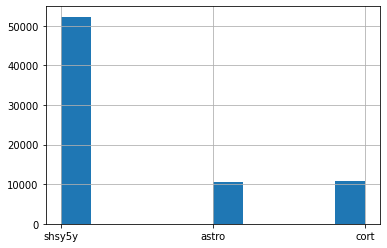

In [6]:
unique_names = train_data.cell_type.unique()
print(f"List of unique types of cells: {unique_names}")

train_data.cell_type.hist()

There are 3 types of cells: shsy5y, astro, cort, let's visualize 10 images of each type.

In [7]:
def visualize_image_with_annotations(cell_annotations: pd.Series):
    single_cell_masks = np.array(list(map(annotation2mask, cell_annotations)))

    image_mask = np.sum(single_cell_masks, axis=0)
    image_mask[image_mask > 1] = 1
    yellow_mask = np.stack([image_mask, image_mask, np.zeros_like(image_mask)], axis=2)

    image_with_mask = np.array(image + 50 * yellow_mask, dtype=np.uint8)
    return image_with_mask

Displaying shsy5y cell type...


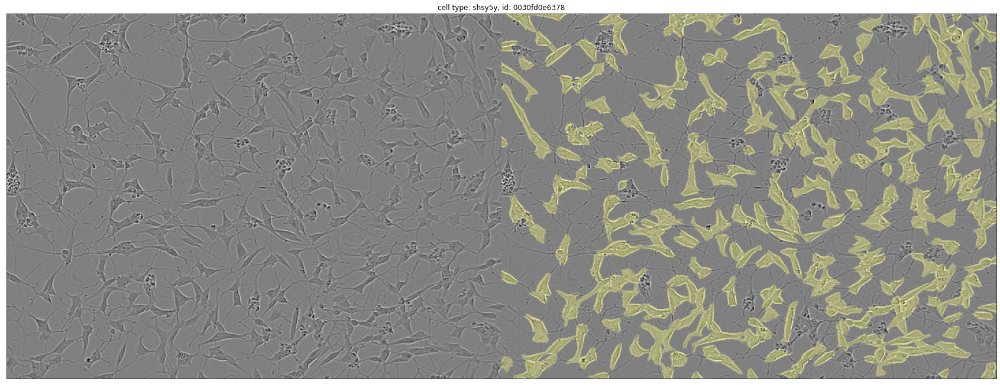

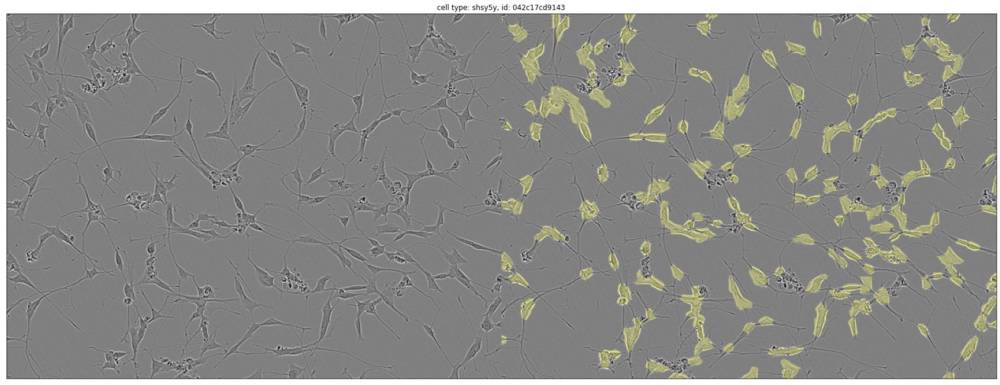

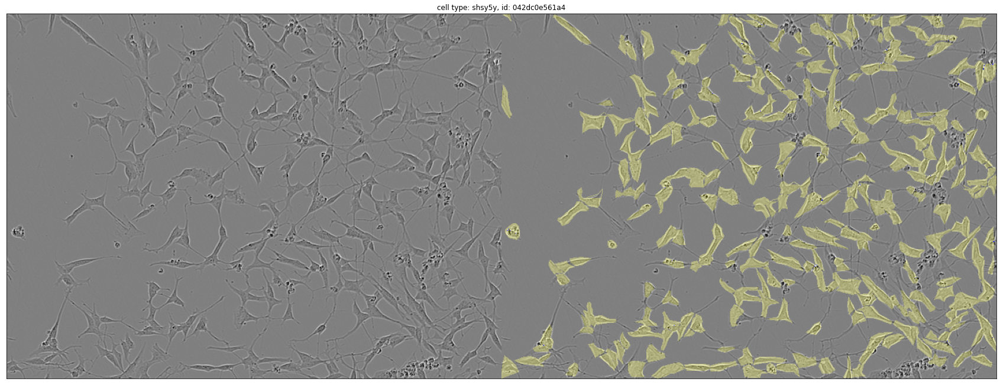

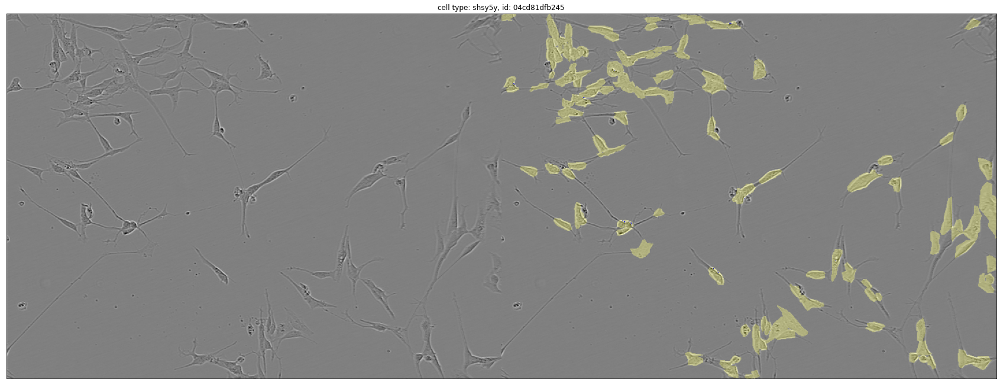

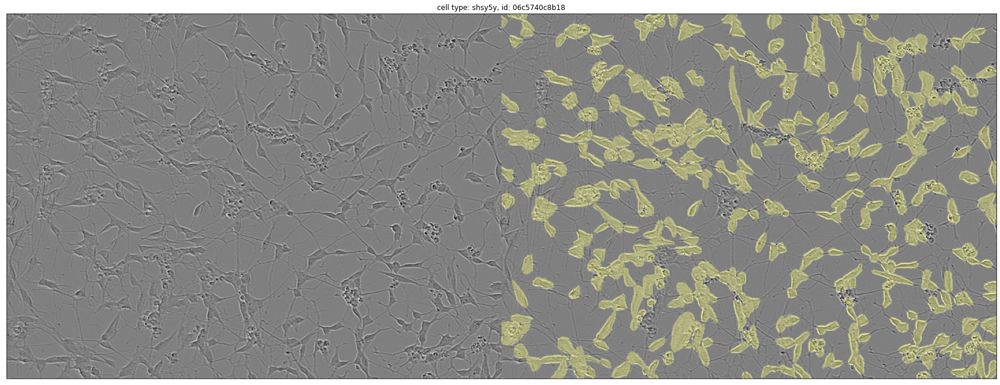

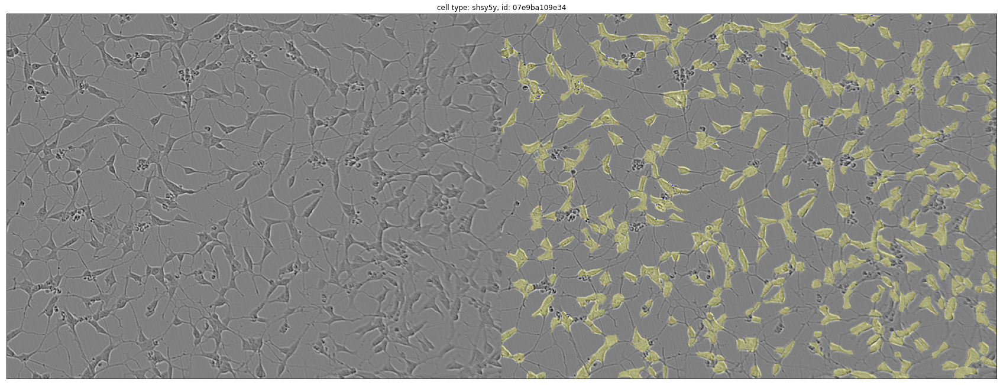

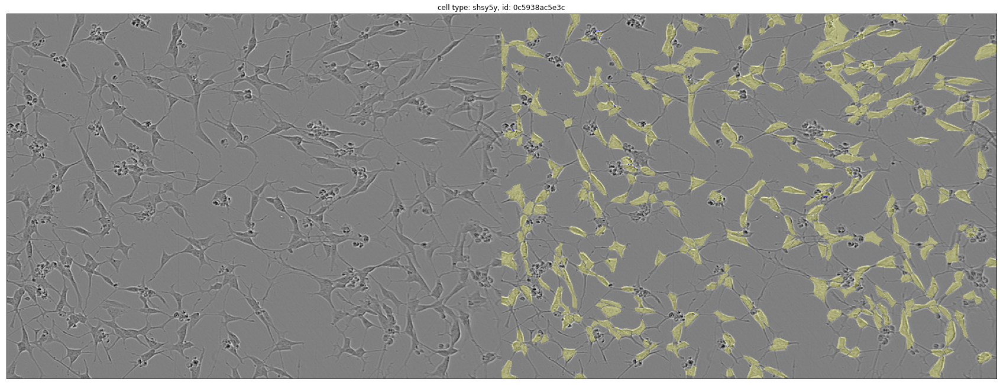

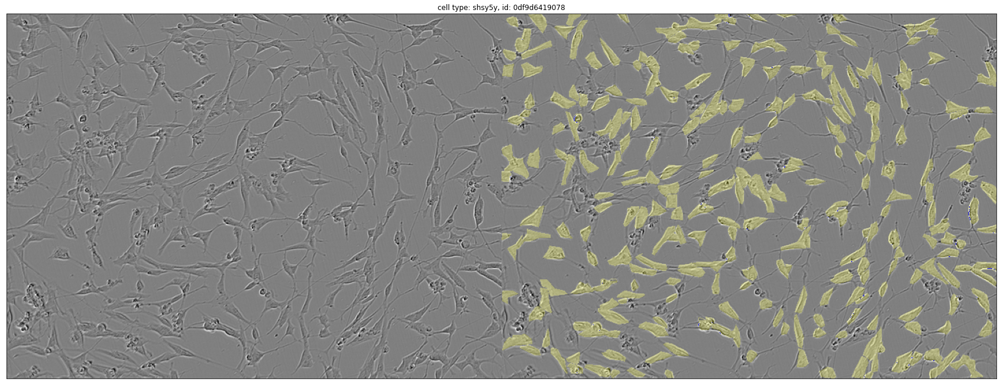

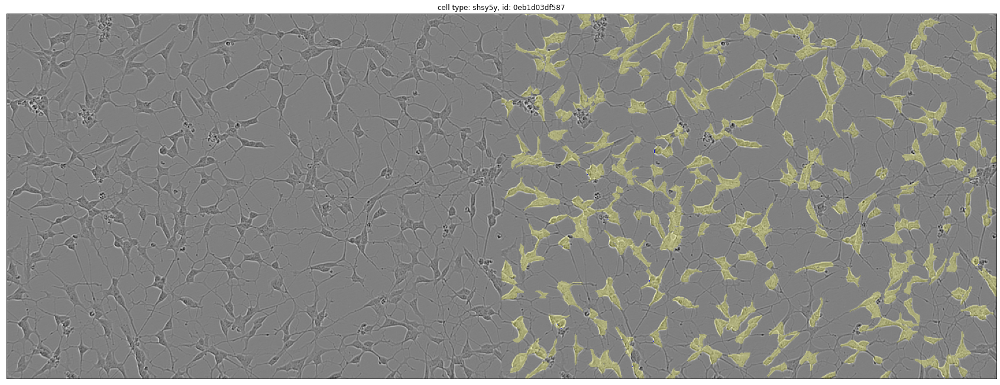

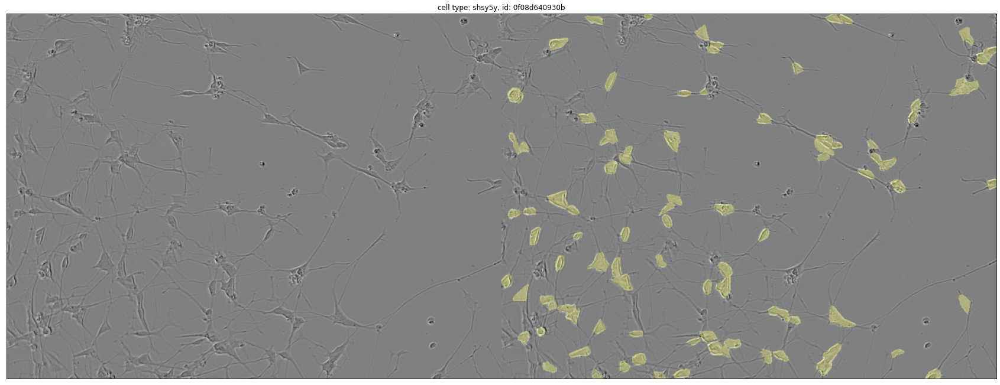

Displaying astro cell type...


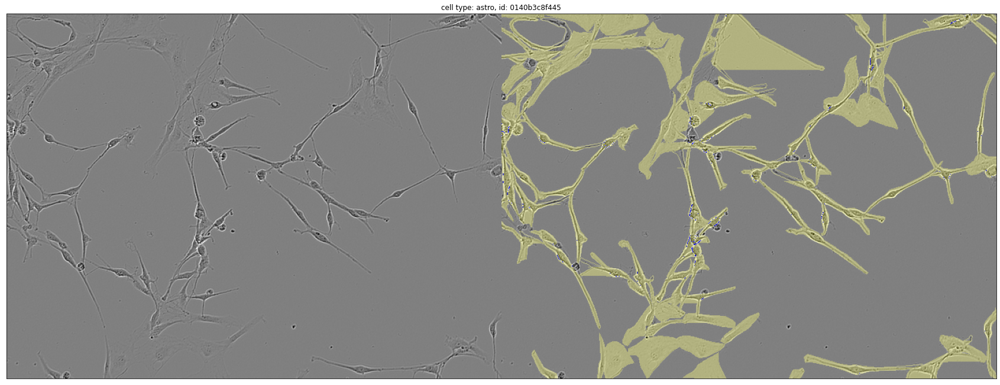

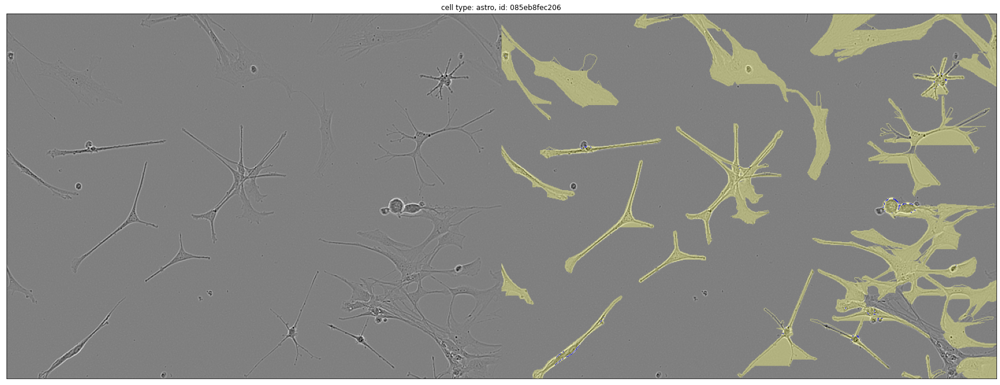

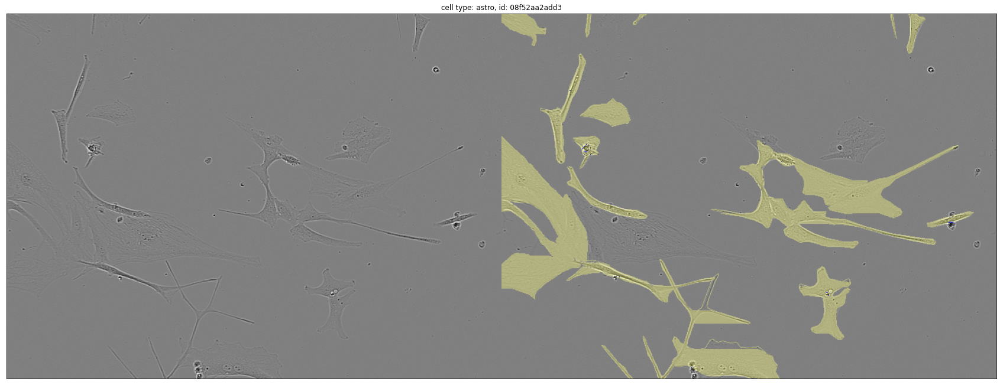

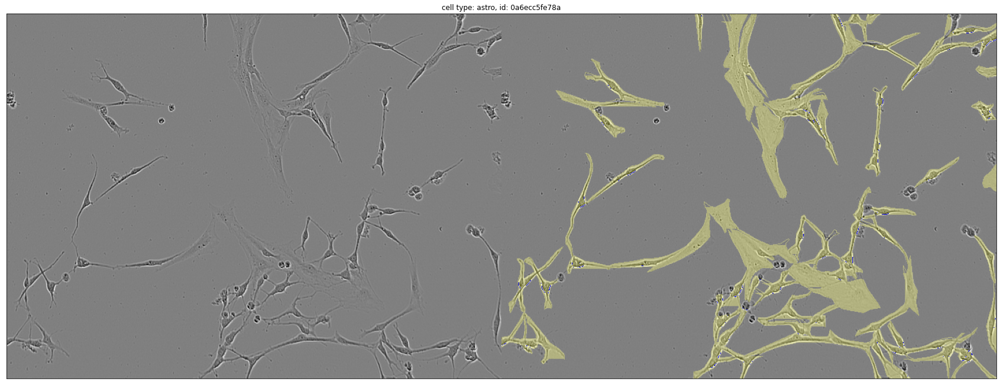

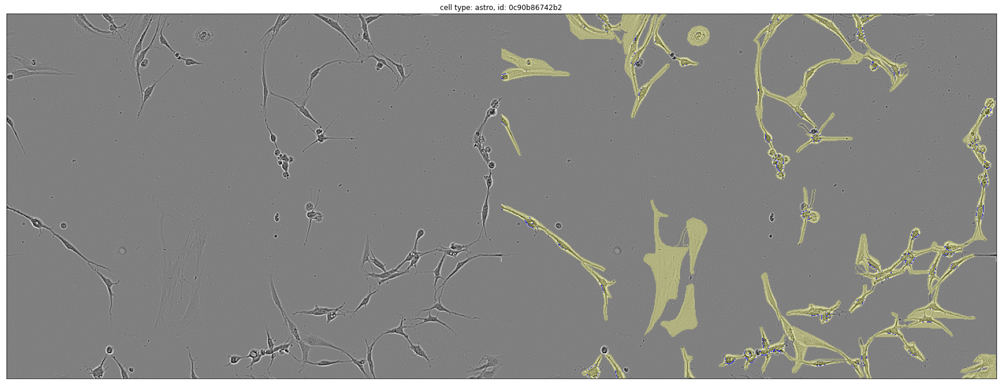

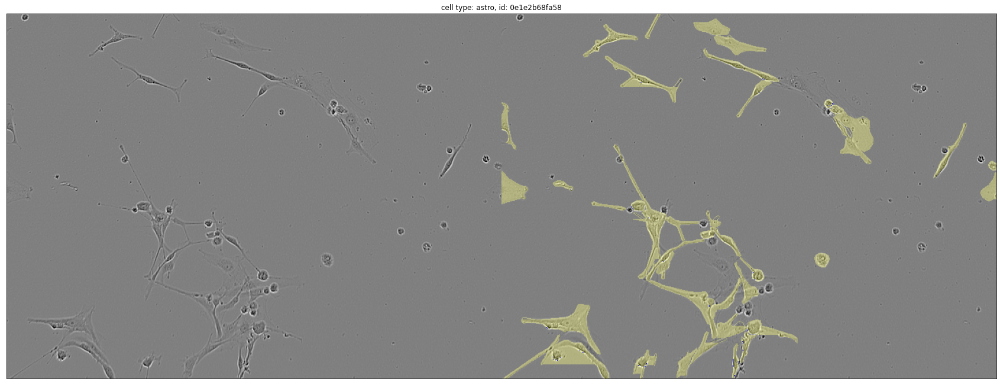

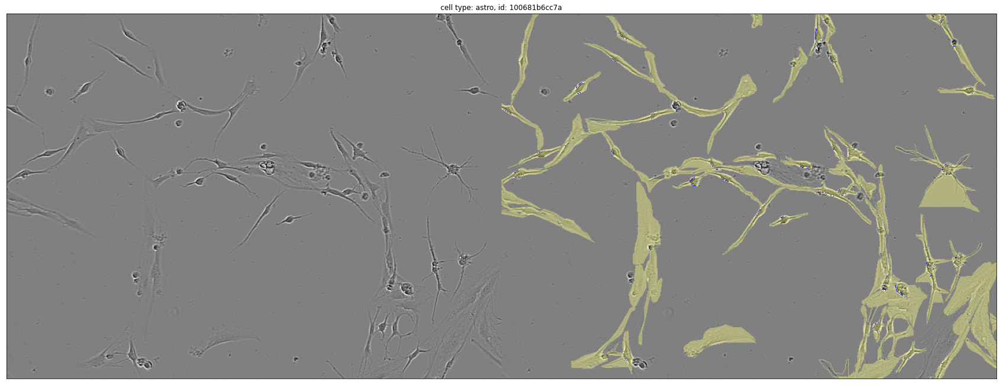

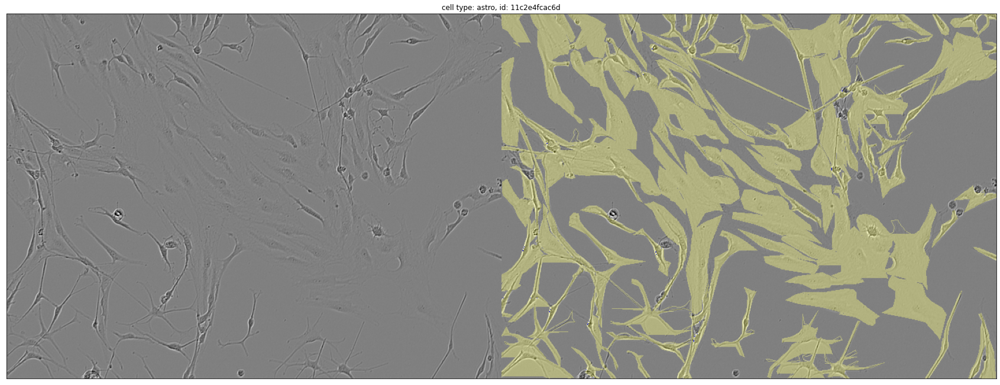

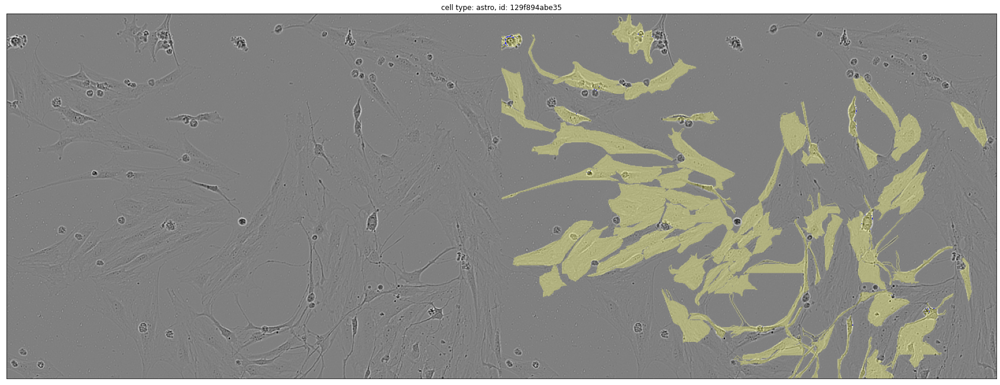

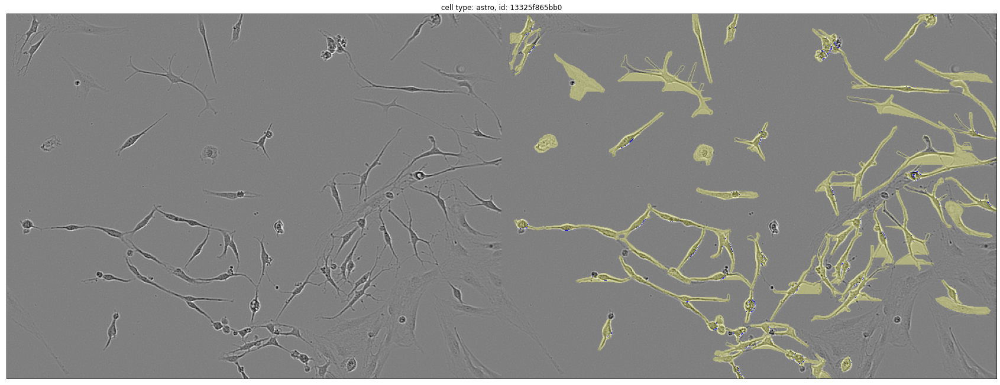

Displaying cort cell type...


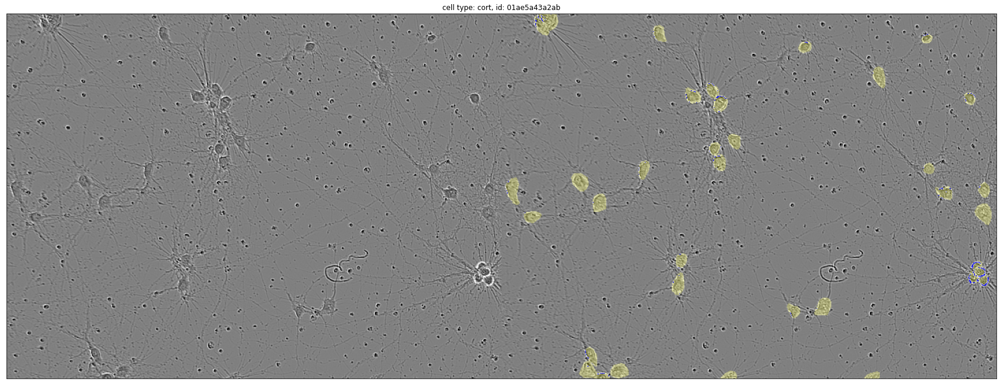

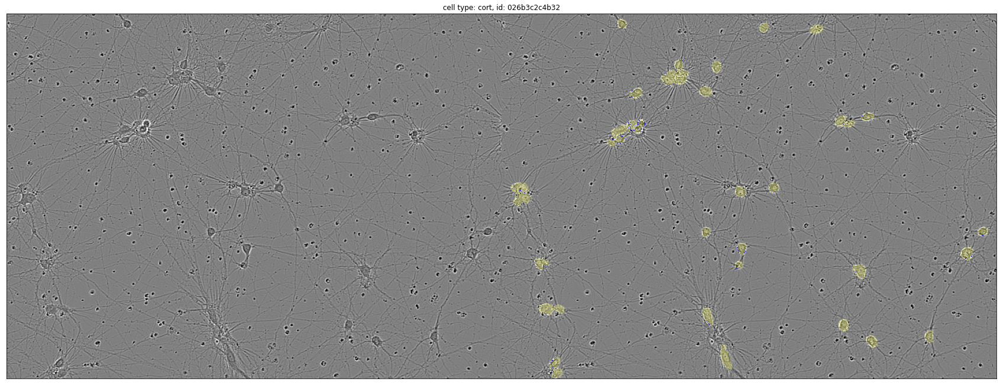

KeyboardInterrupt: 

In [8]:
plt.rcParams["figure.figsize"] = (30, 30)

n_images = 10
for name in unique_names:
    print(f"Displaying {name} cell type...")
    data = train_data[train_data.cell_type == name]

    for image_id in data.id.unique()[:n_images]:
        image = imread(str(train_images / f"{image_id}.png"))
        image = gray2rgb(image)

        visualization = visualize_image_with_annotations(data[data.id == image_id].annotation)
        plt.imshow(np.concatenate([image, visualization], axis=1))
        plt.title(f"cell type: {name}, id: {image_id}")
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.show()

